# Import Packages

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Import Dataset

In [3]:
!rm -rf *
!git clone https://github.com/hmda77/Ensemble-Indoor-Loc.git

Cloning into 'Ensemble-Indoor-Loc'...
remote: Enumerating objects: 72, done.
remote: Counting objects: 100% (72/72), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 72 (delta 27), reused 25 (delta 10), pack-reused 0
Receiving objects: 100% (72/72), 1.03 MiB | 3.18 MiB/s, done.
Resolving deltas: 100% (27/27), done.


In [4]:
!mv /content/Ensemble-Indoor-Loc/JUIndoorLoc/JUIndoorLoc-Test-data.csv /content/
!mv /content/Ensemble-Indoor-Loc/JUIndoorLoc/JUIndoorLoc-Training-data.csv /content/
!rm -rf /content/Ensemble-Indoor-Loc/

In [2]:
tr_path = "C://Users/Hamid/content/JUIndoorLoc-Training-data.csv"
ts_path = "C://Users/Hamid/content/JUIndoorLoc-Test-data.csv"

# tr_path = "/content/JUIndoorLoc-Training-data.csv"
# ts_path = "/content/JUIndoorLoc-Test-data.csv"

In [3]:
data_train = pd.read_csv(tr_path)
data_train.head(5)
data_test = pd.read_csv(ts_path)
data_test.head(5)

,Cid,AP001,AP002,AP003,AP004,AP005,AP006,AP007,AP008,AP009,...,AP167,AP168,AP169,AP170,AP171,AP172,Rs,Hpr,Did,Ts
0,L4-33-13,-77,-58,-66,-64,-92,-66,-66,-93,-93,...,-110,-110,-110,-110,-110,-110,0,0,D2,1489813137748
1,L4-33-13,-90,-58,-78,-56,-92,-74,-74,-87,-93,...,-110,-110,-110,-110,-110,-110,0,0,D2,1489813179138
2,L4-33-13,-80,-64,-78,-56,-92,-74,-74,-87,-93,...,-110,-110,-110,-110,-110,-110,0,0,D2,1489812948443
3,L4-33-13,-72,-60,-74,-58,-93,-75,-76,-95,-93,...,-110,-110,-110,-110,-110,-110,0,0,D2,1489812959103
4,L4-33-13,-82,-56,-74,-56,-93,-71,-76,-89,-110,...,-110,-110,-110,-110,-110,-110,0,0,D2,1489813079167


In [4]:
frames = [data_train, data_test]
df = pd.concat(frames)
df.head(5)

,Cid,AP001,AP002,AP003,AP004,AP005,AP006,AP007,AP008,AP009,...,AP167,AP168,AP169,AP170,AP171,AP172,Rs,Hpr,Did,Ts
0,L4-40-1,-84,-80,-71,-58,-110,-72,-71,-110,-110,...,-110,-110,-110,-110,-110,-110,0,1,D4,1469870570949
1,L4-40-1,-84,-79,-71,-58,-110,-72,-71,-110,-110,...,-110,-110,-110,-110,-110,-110,0,1,D4,1470047205646
2,L4-40-1,-110,-110,-70,-56,-110,-69,-68,-110,-110,...,-110,-110,-110,-110,-110,-110,0,1,D4,1469870932338
3,L4-40-1,-110,-110,-70,-53,-110,-69,-68,-110,-110,...,-110,-110,-110,-110,-110,-110,0,1,D4,1470047629440
4,L4-37-2,-84,-82,-75,-65,-110,-73,-75,-110,-110,...,-110,-110,-110,-110,-110,-110,0,1,D4,1469876622694


In [5]:
df['Did'] = df['Did'].astype(str).str[1]
df['Did'] = pd.to_numeric(df['Did'])


# Data Cleaning

## Missing value

In [ ]:
# Count missing values in each column
missing_values = df.isnull().sum()

# Display the count of missing values
print("\nCount of missing values in each column:")
print(missing_values.sum())


Count of missing values in each column:
0


## Duplicated Data

In [ ]:
# Count duplicated records in each column
duplicated_counts = df.duplicated().sum()

# Display the count of duplicated records
print("\nCount of duplicated records in each column:")
print(duplicated_counts)


Count of duplicated records in each column:
0


# Exploratory Data Analysis (EDA)

## distribution of each feature

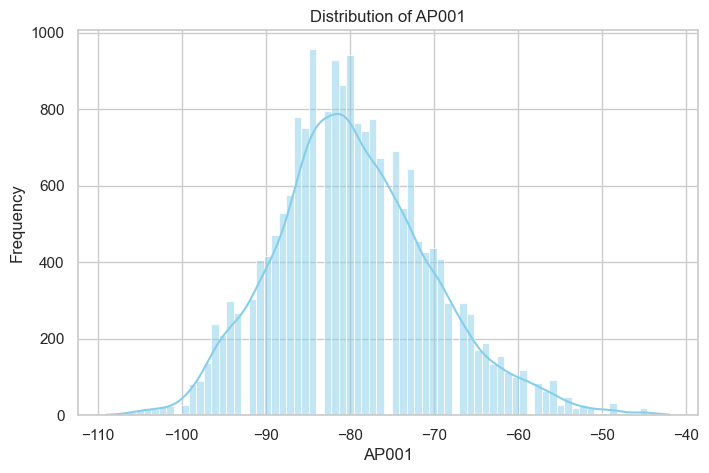

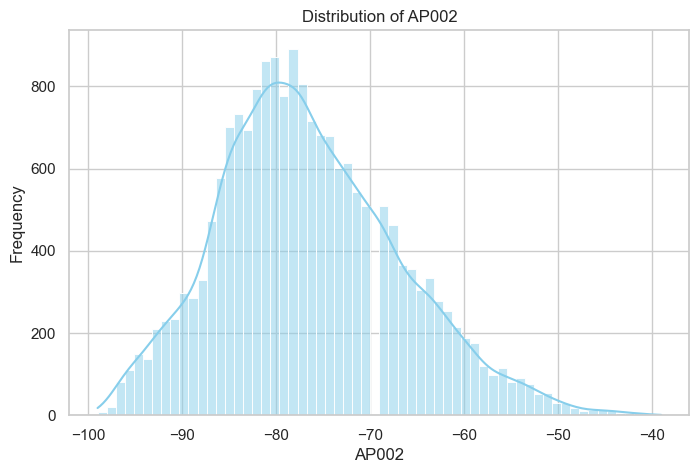

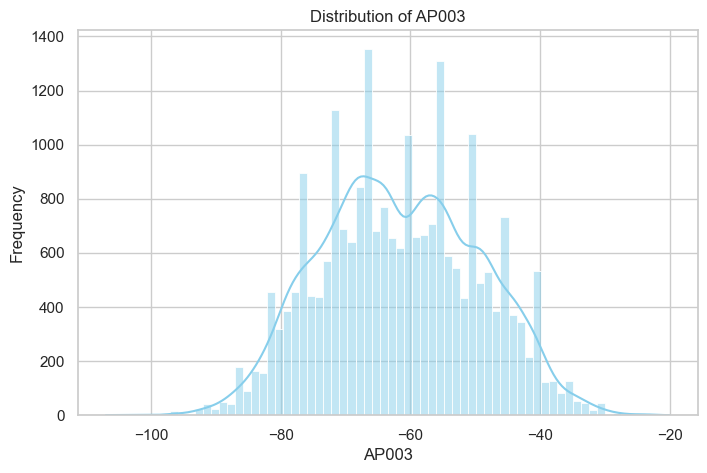

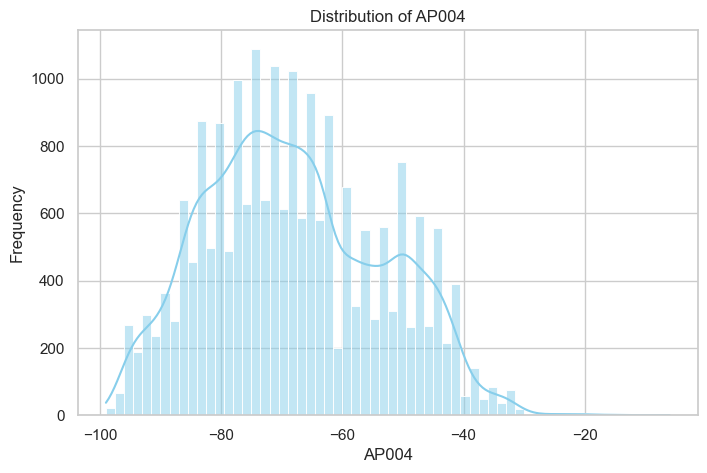

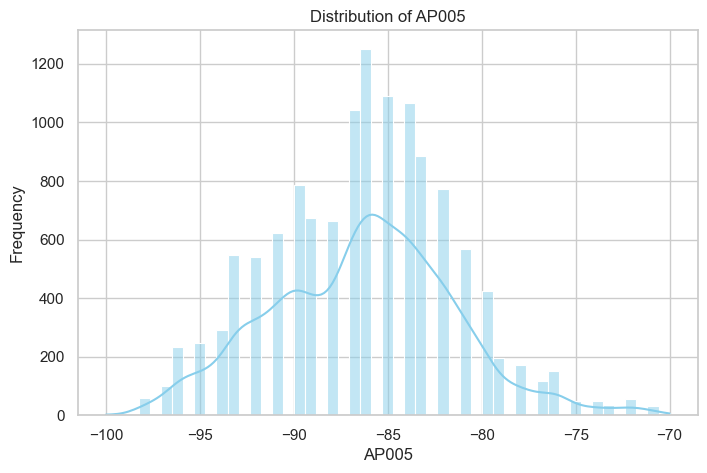

...

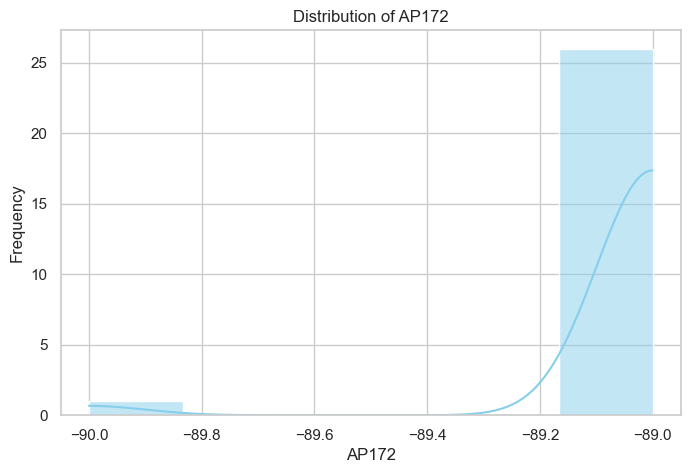

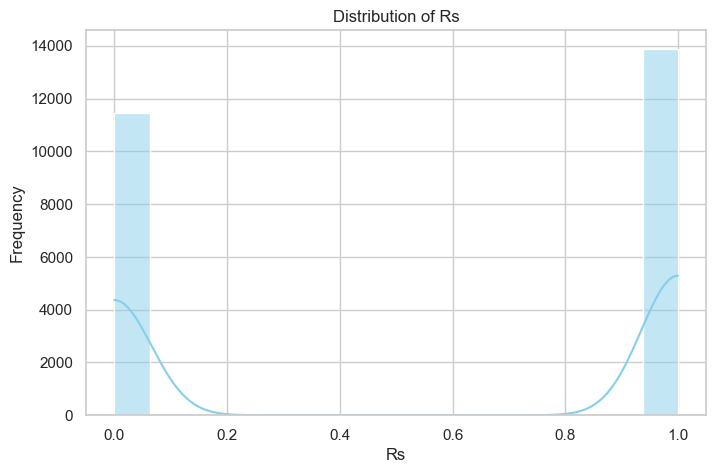

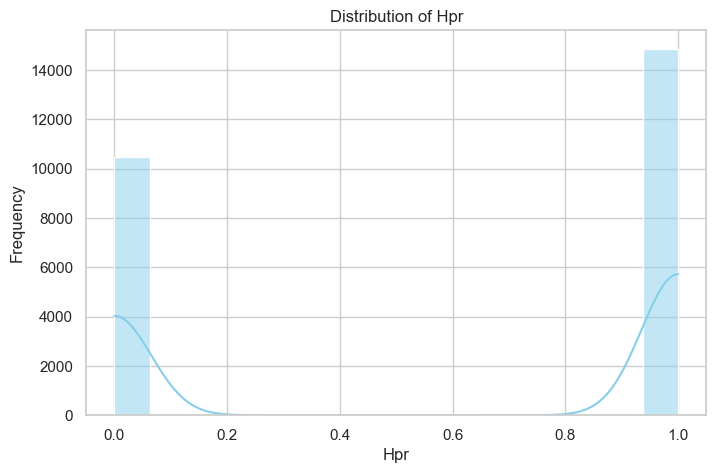

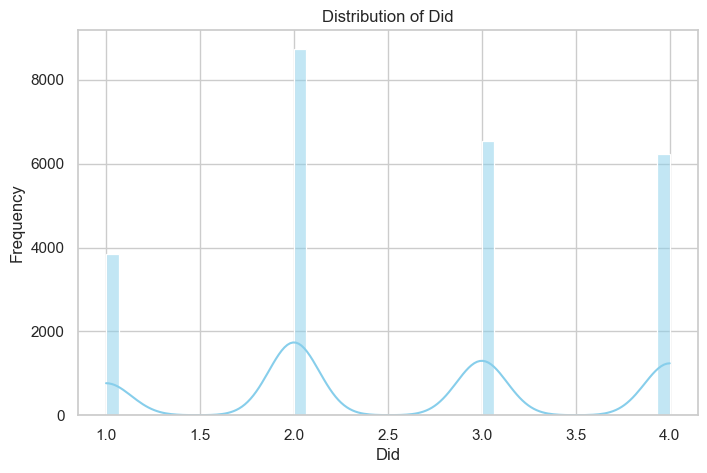

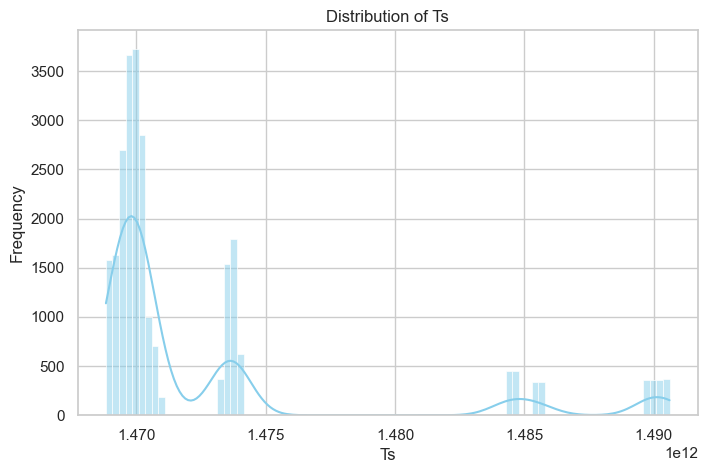

In [ ]:
# Set the style for seaborn plots
sns.set(style="whitegrid")
selected_column = df.drop(columns='Cid')
# Plot the distribution of each feature
for column in selected_column.columns:
  plt.figure(figsize=(8, 5))
  values_to_plot = selected_column[column][selected_column[column] > -110]
  sns.histplot(values_to_plot, kde=True, color='skyblue')
  plt.title(f'Distribution of {column}')
  plt.xlabel(column)
  plt.ylabel('Frequency')
  plt.show()

In [ ]:
sum(df.nunique() >= 10)

86

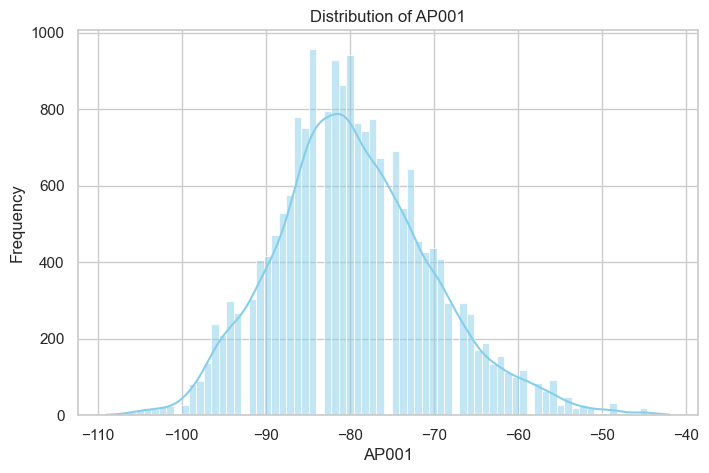

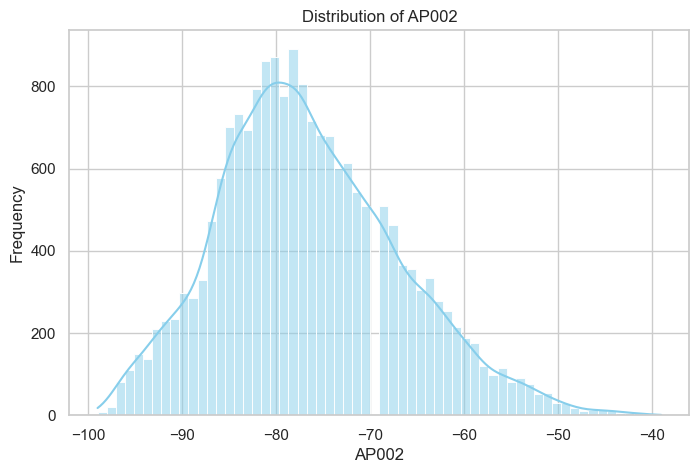

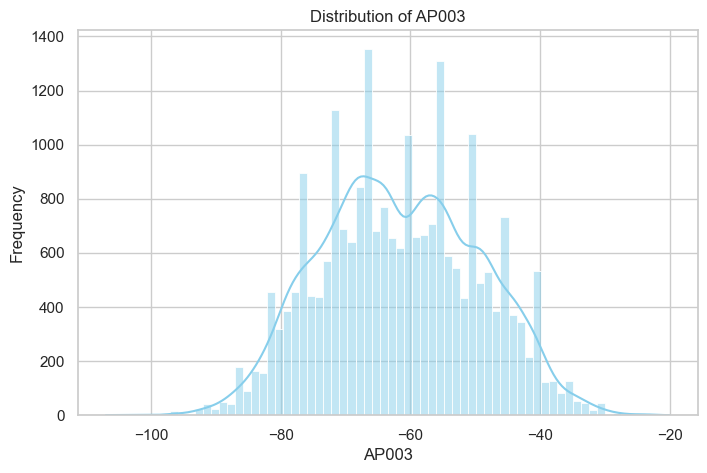

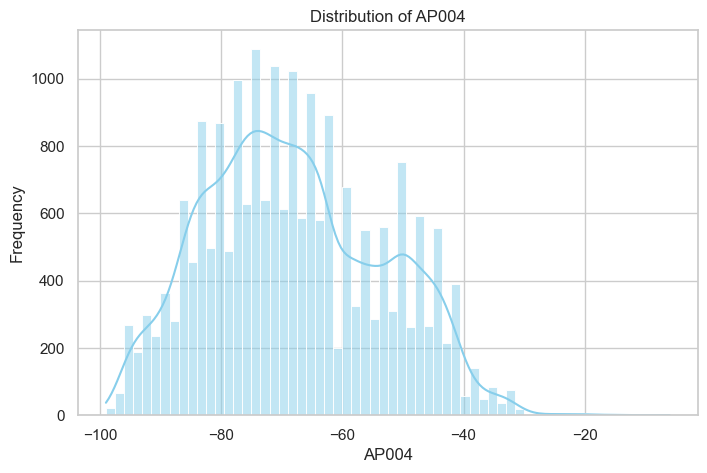

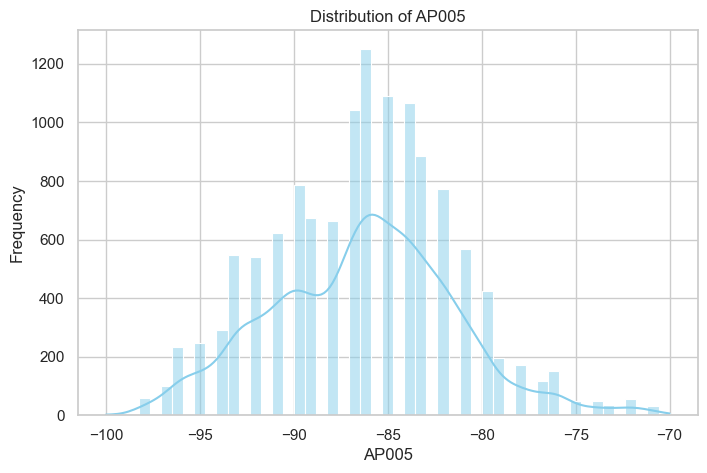

...

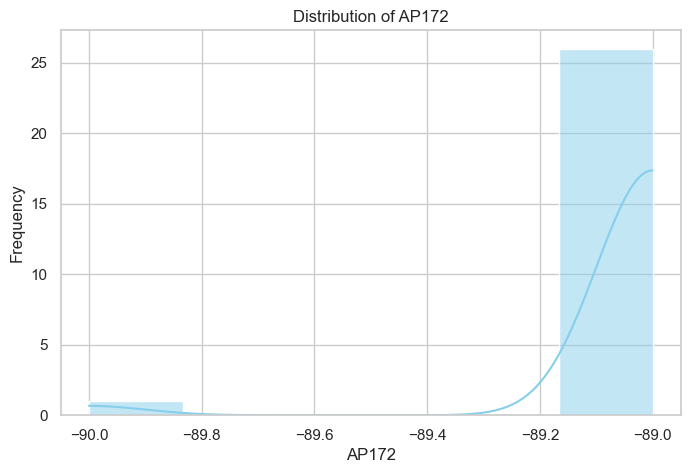

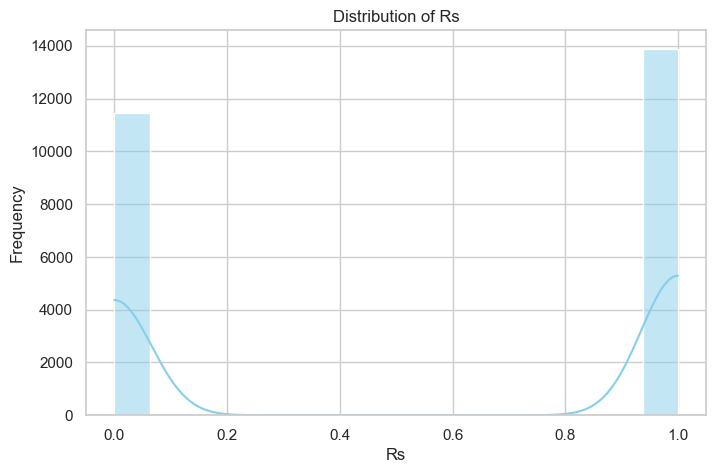

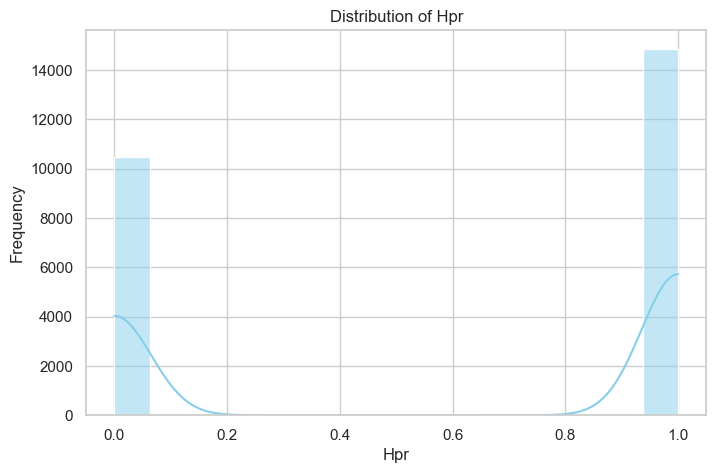

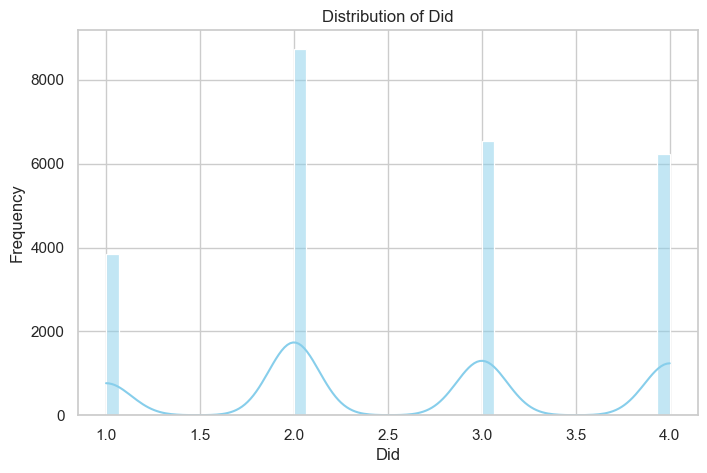

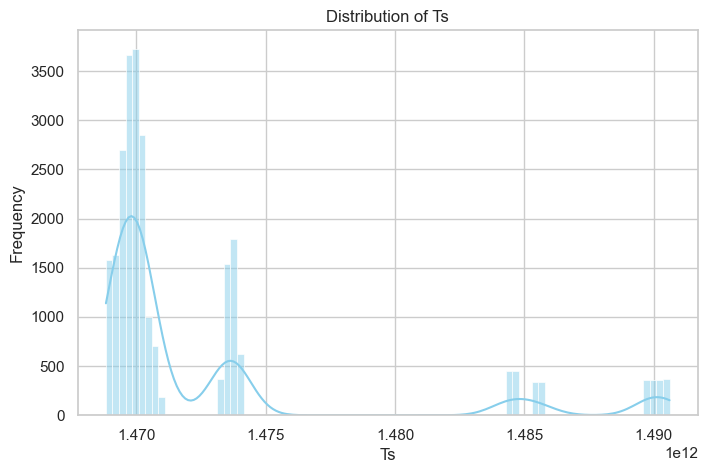

In [ ]:
# Set the style for seaborn plots
sns.set(style="whitegrid")
selected_column = df.drop(columns='Cid')
selected_columns = df.columns[df.nunique() >= 20]

# Plot the distribution of each feature
for column in selected_column.columns:
  plt.figure(figsize=(8, 5))
  values_to_plot = selected_column[column][selected_column[column] > -110]
  sns.histplot(values_to_plot, kde=True, color='skyblue')
  plt.title(f'Distribution of {column}')
  plt.xlabel(column)
  plt.ylabel('Frequency')
  plt.show()

## Identify Outliers

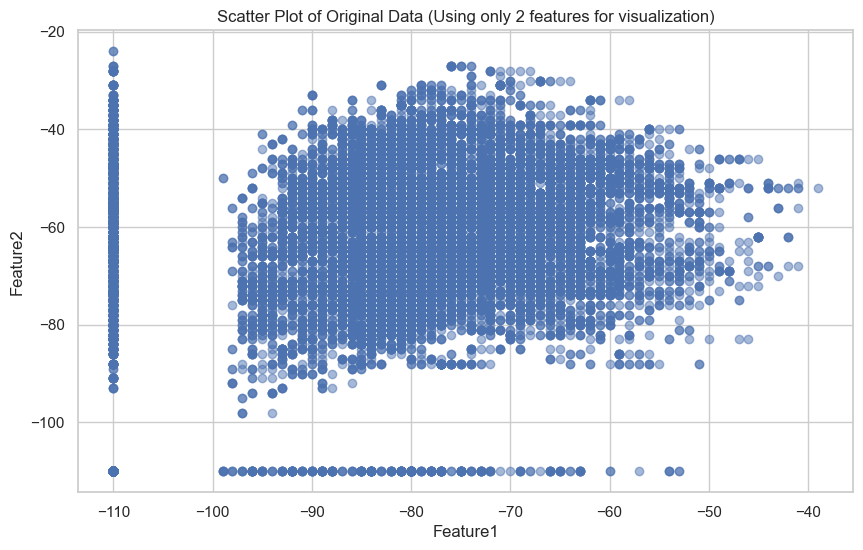

In [ ]:
from sklearn.ensemble import IsolationForest
df_cpy = df.drop(columns='Cid')
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_cpy)

# Visualize the data before handling outliers (consider plotting only a subset of features)
plt.figure(figsize=(10, 6))
plt.scatter(df_cpy.iloc[:, 1], df_cpy.iloc[:, 6], alpha=0.5)
plt.title('Scatter Plot of Original Data (Using only 2 features for visualization)')
plt.xlabel('Feature1')
plt.ylabel('Feature2')
plt.show()


In [ ]:
# Identify outliers using Isolation Forest
clf = IsolationForest(contamination=0.05, random_state=42)
outliers = clf.fit_predict(data_scaled)

In [ ]:
# Mark outliers in the DataFrame
df_cpy['IsOutlier'] = outliers

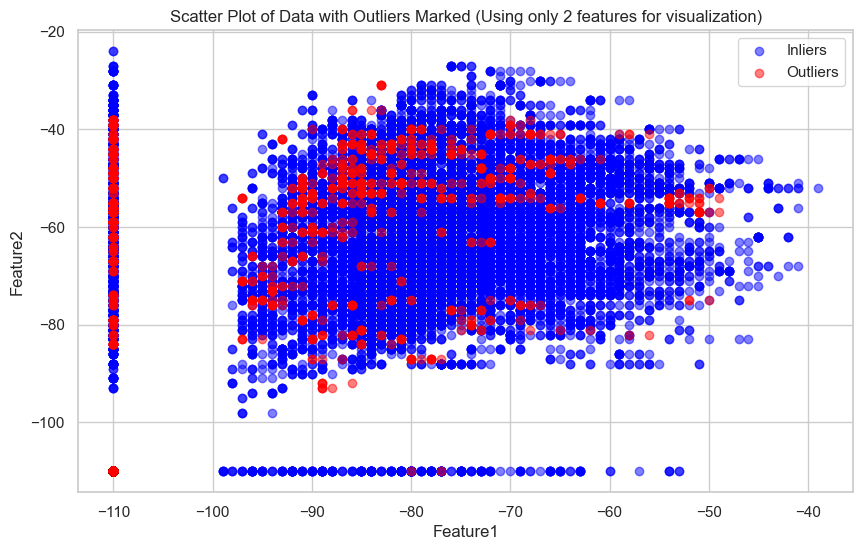

In [ ]:
# Visualize the data after handling outliers (consider plotting only a subset of features)
plt.figure(figsize=(10, 6))
plt.scatter(df_cpy[df_cpy['IsOutlier'] == 1].iloc[:, 1], df_cpy[df_cpy['IsOutlier'] == 1].iloc[:, 6], color='blue', label='Inliers', alpha=0.5)
plt.scatter(df_cpy[df_cpy['IsOutlier'] == -1].iloc[:, 1], df_cpy[df_cpy['IsOutlier'] == -1].iloc[:, 6], color='red', label='Outliers', alpha=0.5)
plt.title('Scatter Plot of Data with Outliers Marked (Using only 2 features for visualization)')
plt.xlabel('Feature1')
plt.ylabel('Feature2')
plt.legend()
plt.show()


In [ ]:
# Handle outliers (e.g., by removing them)
data_cleaned = df_cpy[df_cpy['IsOutlier'] == 1].drop('IsOutlier', axis=1)

# Display the cleaned DataFrame
print("\nCleaned DataFrame:")
df_cpy.head(5)


Cleaned DataFrame:


,AP001,AP002,AP003,AP004,AP005,AP006,AP007,AP008,AP009,AP010,...,AP168,AP169,AP170,AP171,AP172,Rs,Hpr,Did,Ts,IsOutlier
0,-84,-80,-71,-58,-110,-72,-71,-110,-110,-110,...,-110,-110,-110,-110,-110,0,1,4,1469870570949,1
1,-84,-79,-71,-58,-110,-72,-71,-110,-110,-110,...,-110,-110,-110,-110,-110,0,1,4,1470047205646,1
2,-110,-110,-70,-56,-110,-69,-68,-110,-110,-110,...,-110,-110,-110,-110,-110,0,1,4,1469870932338,1
3,-110,-110,-70,-53,-110,-69,-68,-110,-110,-110,...,-110,-110,-110,-110,-110,0,1,4,1470047629440,1
4,-84,-82,-75,-65,-110,-73,-75,-110,-110,-110,...,-110,-110,-110,-110,-110,0,1,4,1469876622694,1


# Plot the Labels Occurrence

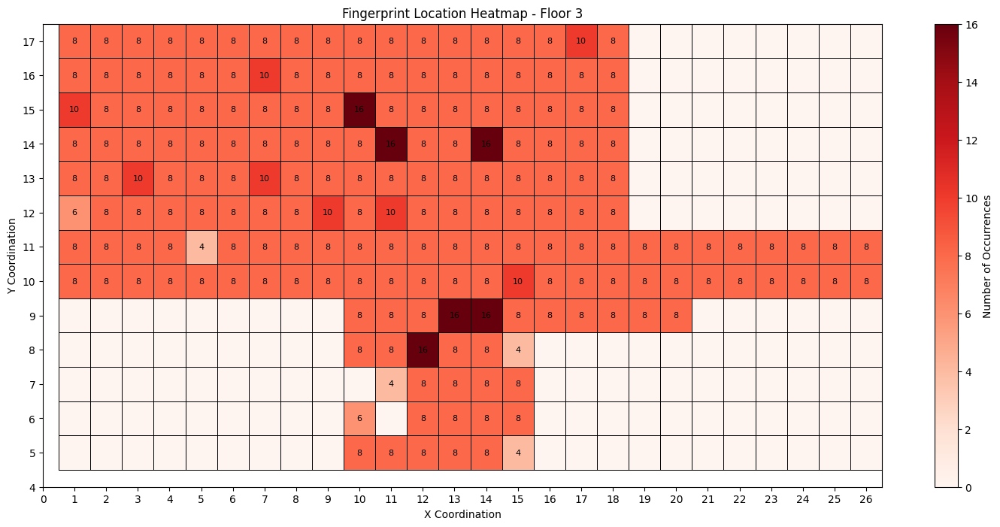

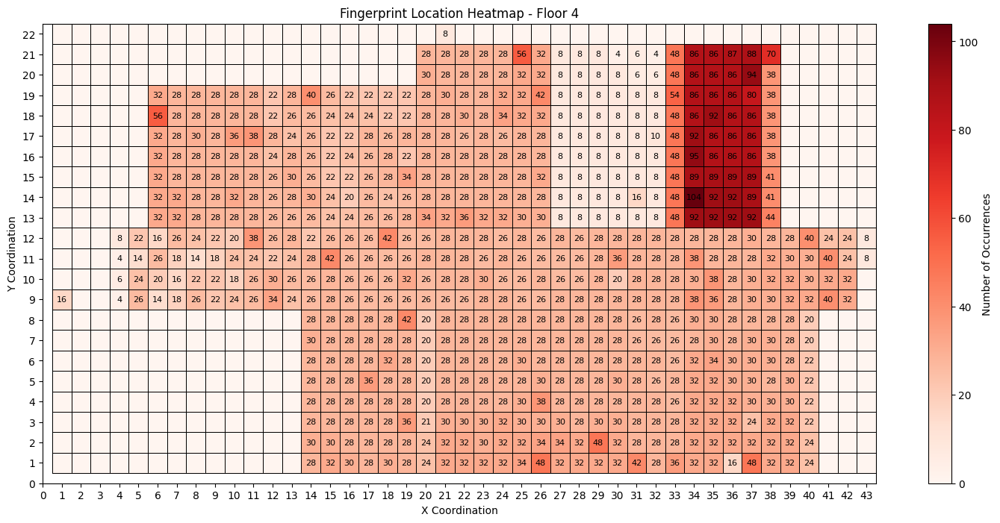

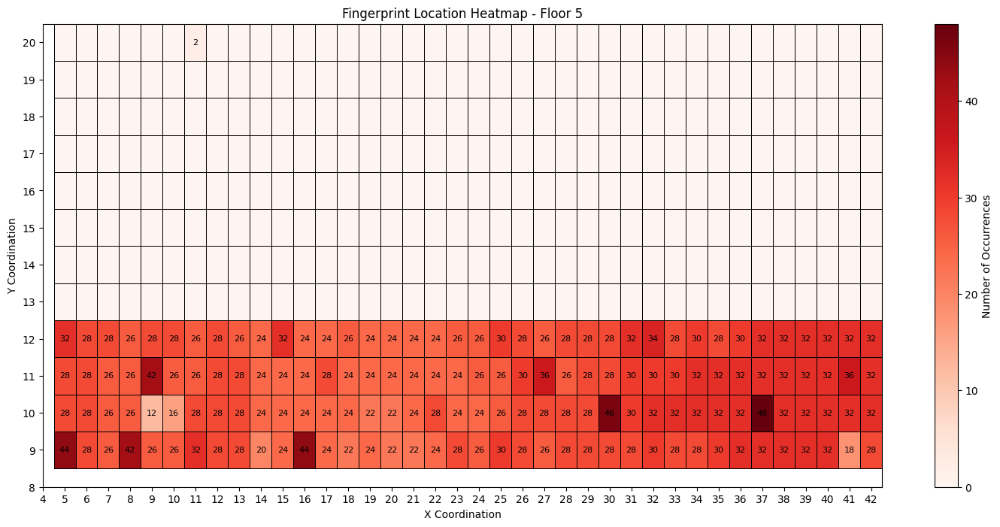

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# Assuming your dataset is in a DataFrame named 'df'
# Replace 'df' with the actual DataFrame name

# Create a new DataFrame with extracted information from 'Label'
df2 = pd.DataFrame()
df2[['Level', 'X', 'Y']] = df['Cid'].str.extract(r'L(\d+)-(\d+)-(\d+)').astype(int)

# Plot heatmaps for each floor
for floor in range(3, 6):
    floor_data = df2[df2['Level'] == floor]

    # Define bin edges to align with integer values
    xedges = np.arange(floor_data['X'].min() - 0.5, floor_data['X'].max() + 1.5, 1)
    yedges = np.arange(floor_data['Y'].min() - 0.5, floor_data['Y'].max() + 1.5, 1)

    # Create a 2D histogram to count occurrences of each X-Y pair
    heatmap, xedges, yedges = np.histogram2d(floor_data['X'], floor_data['Y'], bins=[xedges, yedges])

    # Plot the heatmap with integer values and black borders around each block
    plt.figure(figsize=(18, 8))
    plt.pcolormesh(xedges, yedges, heatmap.T, cmap='Reds', shading='auto', edgecolors='black', linewidth=0.5)

    # Display integer values in the middle of each block
    for i in range(len(xedges) - 1):
        for j in range(len(yedges) - 1):
            value = int(heatmap[i, j])
            if value > 0:  # Display non-zero values only
                plt.text((xedges[i] + xedges[i + 1]) / 2, (yedges[j] + yedges[j + 1]) / 2, value,
                         ha='center', va='center', color='black', fontsize=8)

    # Add colorbar
    cbar = plt.colorbar()
    cbar.set_label('Number of Occurrences')

    # Set axis labels and title
    plt.xlabel('X Coordination')
    plt.ylabel('Y Coordination')
    plt.title(f'Fingerprint Location Heatmap - Floor {floor}')

    # Set integer ticks on both axes
    plt.xticks(np.arange(int(xedges.min()), int(xedges.max()) + 1, 1))
    plt.yticks(np.arange(int(yedges.min()), int(yedges.max()) + 1, 1))

    # Show the plot
    plt.show()


# Label Reduction

In [ ]:
reduction_factor = 14
df_Reduced = pd.DataFrame()
df_Reduced = df
# Extract floor, X, and Y information from the existing labels
df_Reduced[['Level', 'X', 'Y']] = df['Cid'].str.extract(r'L(\d+)-(\d+)-(\d+)').astype(int)

# Create a new label based on the desired reduction (e.g., by 2)
df_Reduced['New_Label'] = 'L' + (df_Reduced['Level'].astype(str) + '-' +
                        ((df_Reduced['X'] - 1) // reduction_factor + 1).astype(str) + '-' +
                        ((df_Reduced['Y'] - 1) // reduction_factor + 1).astype(str))

# Now 'New_Label' contains the reduced labels
df_Reduced.head(10)

,Cid,AP001,AP002,AP003,AP004,AP005,AP006,AP007,AP008,AP009,...,AP171,AP172,Rs,Hpr,Did,Ts,Level,X,Y,New_Label
0,L4-40-1,-84,-80,-71,-58,-110,-72,-71,-110,-110,...,-110,-110,0,1,4,1469870570949,4,40,1,L4-3-1
1,L4-40-1,-84,-79,-71,-58,-110,-72,-71,-110,-110,...,-110,-110,0,1,4,1470047205646,4,40,1,L4-3-1
2,L4-40-1,-110,-110,-70,-56,-110,-69,-68,-110,-110,...,-110,-110,0,1,4,1469870932338,4,40,1,L4-3-1
3,L4-40-1,-110,-110,-70,-53,-110,-69,-68,-110,-110,...,-110,-110,0,1,4,1470047629440,4,40,1,L4-3-1
4,L4-37-2,-84,-82,-75,-65,-110,-73,-75,-110,-110,...,-110,-110,0,1,4,1469876622694,4,37,2,L4-3-1
5,L4-37-2,-84,-81,-75,-65,-110,-73,-75,-110,-110,...,-110,-110,0,1,4,1470053219985,4,37,2,L4-3-1
6,L4-37-2,-84,-80,-75,-65,-110,-73,-75,-110,-110,...,-110,-110,0,1,4,1469872755941,4,37,2,L4-3-1
7,L4-37-2,-85,-80,-75,-65,-110,-73,-75,-110,-110,...,-110,-110,0,1,4,1470049193697,4,37,2,L4-3-1
8,L4-37-2,-84,-80,-75,-65,-110,-73,-75,-110,-110,...,-110,-110,0,1,4,1469872418233,4,37,2,L4-3-1
9,L4-37-2,-84,-80,-75,-65,-110,-73,-75,-110,-110,...,-110,-110,0,1,4,1470049053388,4,37,2,L4-3-1


In [ ]:
df['New_Label'].unique().shape

(15,)

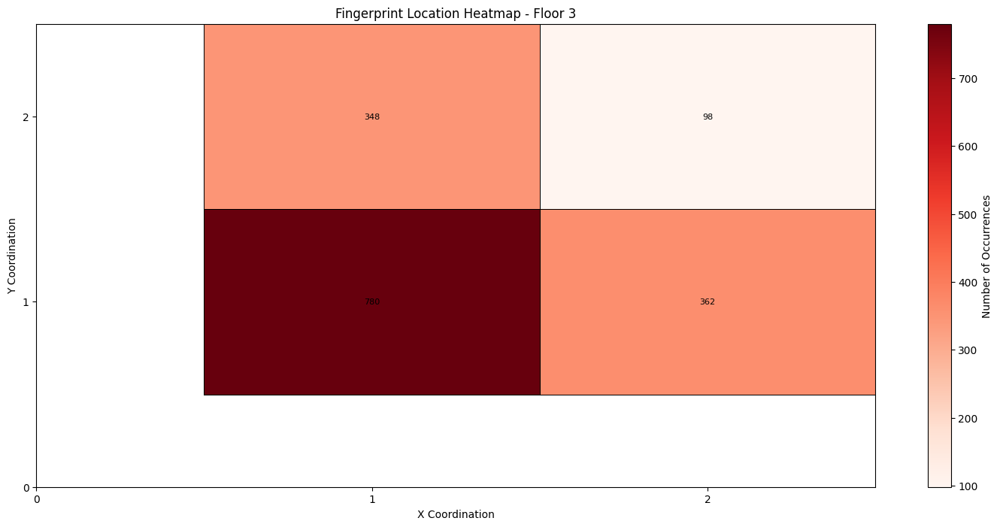

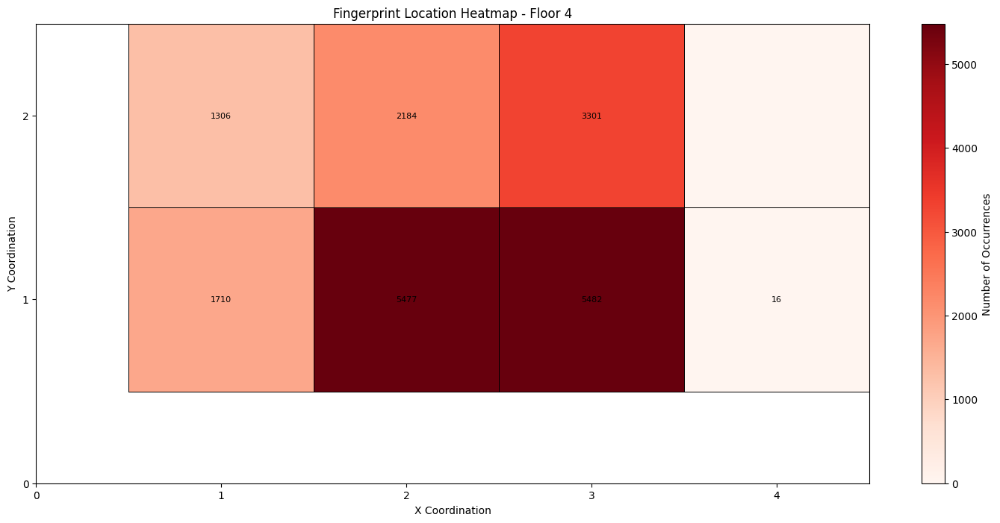

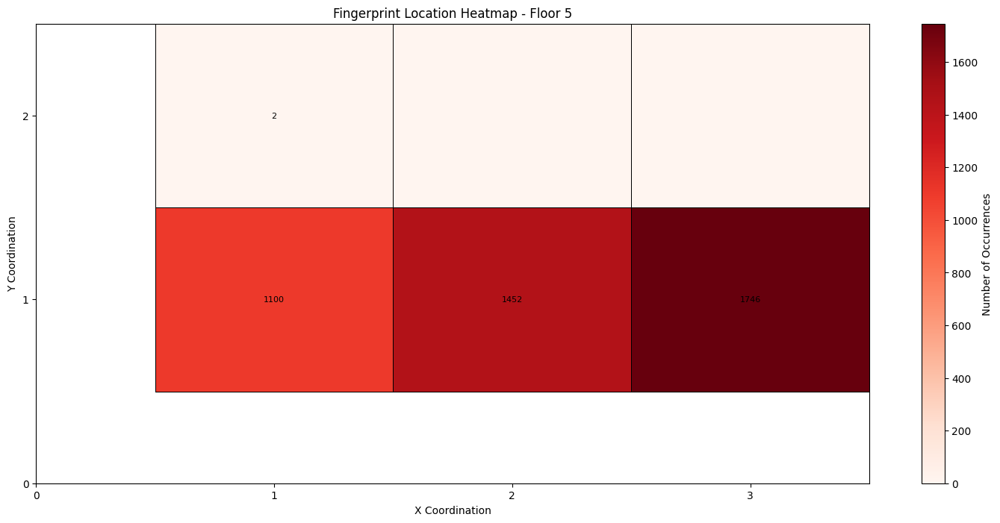

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# Assuming your dataset is in a DataFrame named 'df'
# Replace 'df' with the actual DataFrame name

# Create a new DataFrame with extracted information from 'Label'
df2 = pd.DataFrame()
df2[['Level', 'X', 'Y']] = df_Reduced['New_Label'].str.extract(r'L(\d+)-(\d+)-(\d+)').astype(int)

# Plot heatmaps for each floor
for floor in range(3, 6):
    floor_data = df2[df2['Level'] == floor]

    # Define bin edges to align with integer values
    xedges = np.arange(floor_data['X'].min() - 0.5, floor_data['X'].max() + 1.5, 1)
    yedges = np.arange(floor_data['Y'].min() - 0.5, floor_data['Y'].max() + 1.5, 1)

    # Create a 2D histogram to count occurrences of each X-Y pair
    heatmap, xedges, yedges = np.histogram2d(floor_data['X'], floor_data['Y'], bins=[xedges, yedges])

    # Plot the heatmap with integer values and black borders around each block
    plt.figure(figsize=(18, 8))
    plt.pcolormesh(xedges, yedges, heatmap.T, cmap='Reds', shading='auto', edgecolors='black', linewidth=0.5)

    # Display integer values in the middle of each block
    for i in range(len(xedges) - 1):
        for j in range(len(yedges) - 1):
            value = int(heatmap[i, j])
            if value > 0:  # Display non-zero values only
                plt.text((xedges[i] + xedges[i + 1]) / 2, (yedges[j] + yedges[j + 1]) / 2, value,
                         ha='center', va='center', color='black', fontsize=8)

    # Add colorbar
    cbar = plt.colorbar()
    cbar.set_label('Number of Occurrences')

    # Set axis labels and title
    plt.xlabel('X Coordination')
    plt.ylabel('Y Coordination')
    plt.title(f'Fingerprint Location Heatmap - Floor {floor}')

    # Set integer ticks on both axes
    plt.xticks(np.arange(int(xedges.min()), int(xedges.max()) + 1, 1))
    plt.yticks(np.arange(int(yedges.min()), int(yedges.max()) + 1, 1))

    # Show the plot
    plt.show()


In [ ]:
!pip install palettable

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.3/332.3 kB 2.4 MB/s eta 0:00:00


## 2D t-sne

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

selected_column = df_Reduced.drop(columns='Cid')
selected_column = selected_column.drop(columns='New_Label')
selected_column = selected_column.drop(columns='Ts')
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(selected_column)


# Apply t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=2, random_state=42, n_jobs = -1)
data_tsne = tsne.fit_transform(data_scaled)


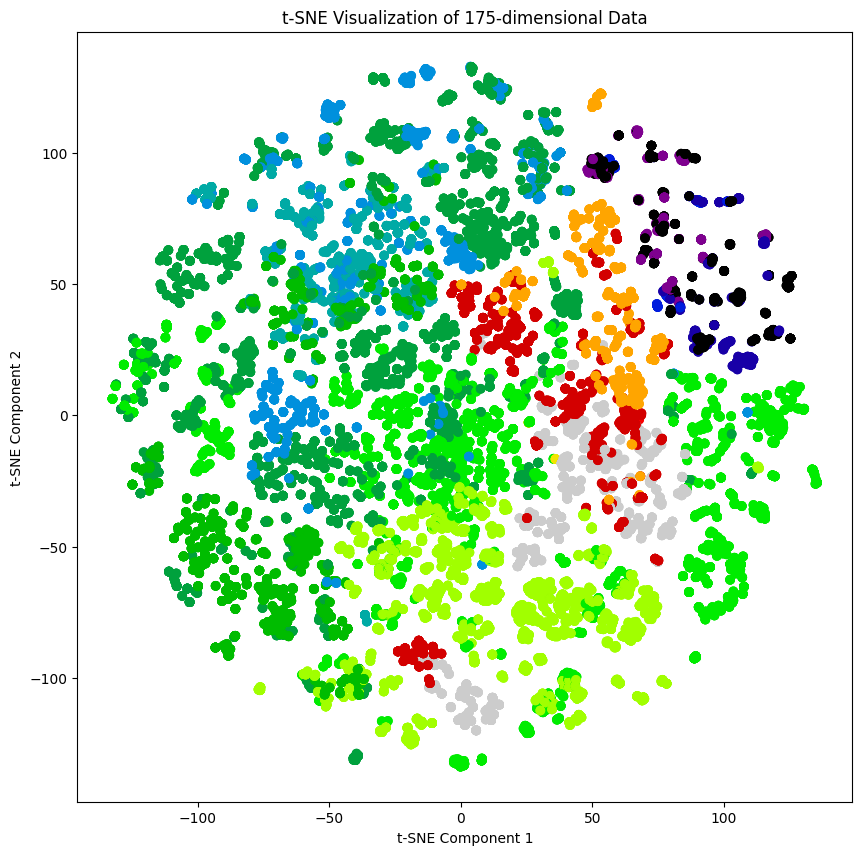

In [ ]:
from sklearn.preprocessing import LabelEncoder
from palettable.colorbrewer import qualitative
import seaborn as sns  # Import seaborn for a high-contrast color palette

# Convert categorical 'y' values to numerical labels
label_encoder = LabelEncoder()
df_Reduced['Cid_encoded'] = label_encoder.fit_transform(df_Reduced['New_Label'])

# Choose a high-contrast color palette (e.g., Set1 from seaborn)
color_palette = sns.color_palette("Set1", len(label_encoder.classes_))

# Create a scatter plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(
    data_tsne[:, 0],
    data_tsne[:, 1],
    c=df_Reduced['Cid_encoded'],
    cmap='nipy_spectral',  # Use seaborn color palette directly
)

# Add colorbar
plt.colorbar(scatter, ticks=range(len(label_encoder.classes_)), label='y-value')
plt.xticks(range(len(label_encoder.classes_)), label_encoder.classes_)

plt.title('t-SNE Visualization of 175-dimensional Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()


## 3D t-sne

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

selected_column = df_Reduced.drop(columns='Cid')
selected_column = selected_column.drop(columns='New_Label')
selected_column = selected_column.drop(columns='Ts')
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(selected_column)


# Apply t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=3, random_state=42, n_jobs = -1)
data_tsne = tsne.fit_transform(data_scaled)


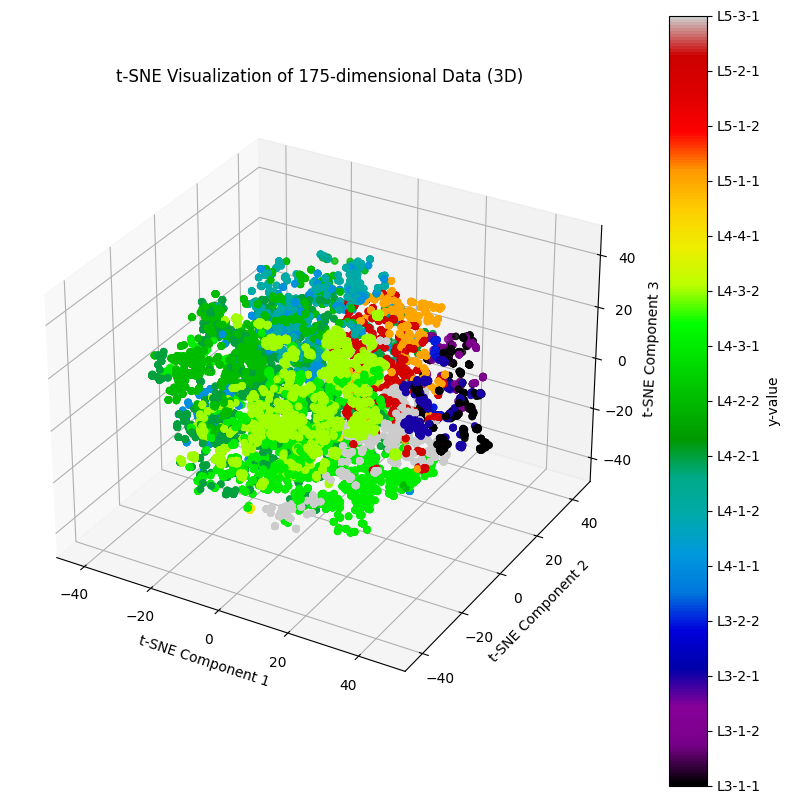

In [ ]:
from sklearn.preprocessing import LabelEncoder
from palettable.colorbrewer import qualitative
import seaborn as sns  # Import seaborn for a high-contrast color palette
from mpl_toolkits.mplot3d import Axes3D  # Import Axes3D for 3D plotting

# Assuming 'data_tsne' has 3 components for t-SNE
data_tsne_3d = data_tsne  # Replace with your 3D t-SNE data

# Convert categorical 'y' values to numerical labels
label_encoder = LabelEncoder()
df_Reduced['Cid_encoded'] = label_encoder.fit_transform(df_Reduced['New_Label'])

# Choose a high-contrast color palette (e.g., Set1 from seaborn)
color_palette = sns.color_palette("Set1", len(label_encoder.classes_))

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    data_tsne_3d[:, 0],
    data_tsne_3d[:, 1],
    data_tsne_3d[:, 2],
    c=df_Reduced['Cid_encoded'],
    cmap='nipy_spectral',  # Use seaborn color palette directly
)

# Add colorbar
cbar = fig.colorbar(scatter, ticks=range(len(label_encoder.classes_)), label='y-value')
cbar.set_ticks(range(len(label_encoder.classes_)))
cbar.set_ticklabels(label_encoder.classes_)

ax.set_title('t-SNE Visualization of 175-dimensional Data (3D)')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')

plt.show()


<ipython-input-73-feb705ca27f2>:8: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


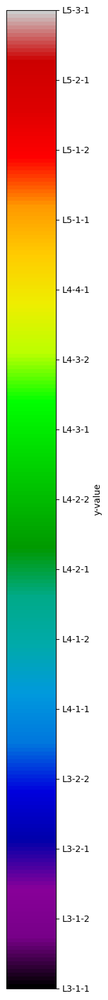

In [ ]:
# Create a separate figure for the colorbar
fig_colorbar, ax_colorbar = plt.subplots(figsize=(1, 20))
cbar = plt.colorbar(scatter, ticks=range(len(label_encoder.classes_)), cax=ax_colorbar, label='y-value')
cbar.set_ticks(range(len(label_encoder.classes_)))
cbar.set_ticklabels(label_encoder.classes_)

# Adjust layout to prevent clipping of colorbar labels
plt.tight_layout()

# Dimension Reduction

## Plot RSSI map

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time


import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score, cross_val_predict

from sklearn.preprocessing import LabelEncoder
from palettable.colorbrewer import qualitative
from mpl_toolkits.mplot3d import Axes3D  # Import Axes3D for 3D plotting

from matplotlib.colors import Normalize

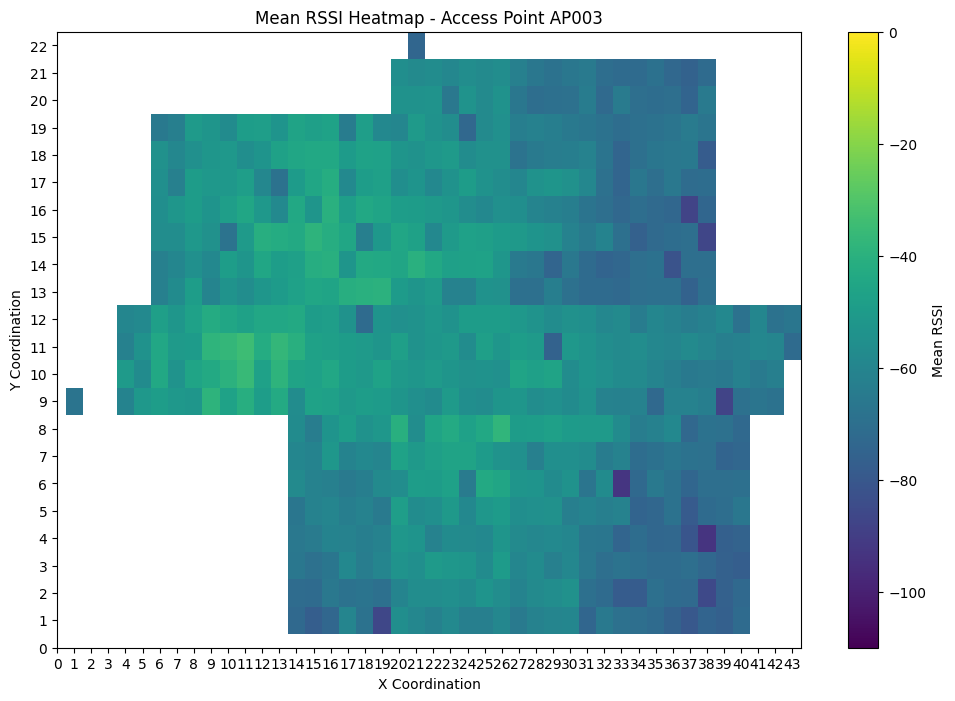

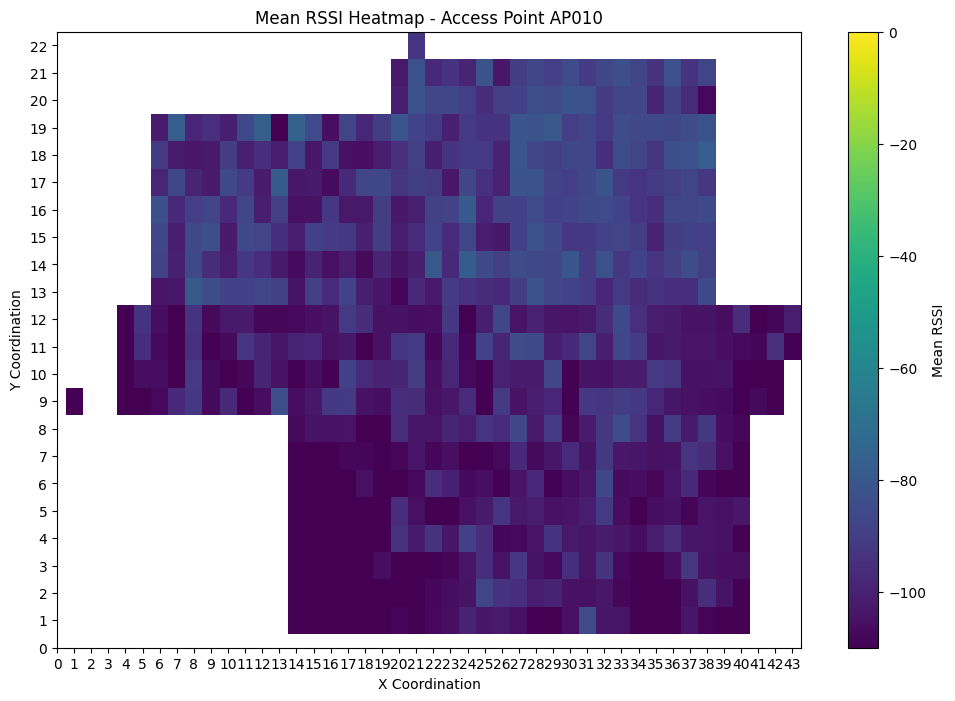

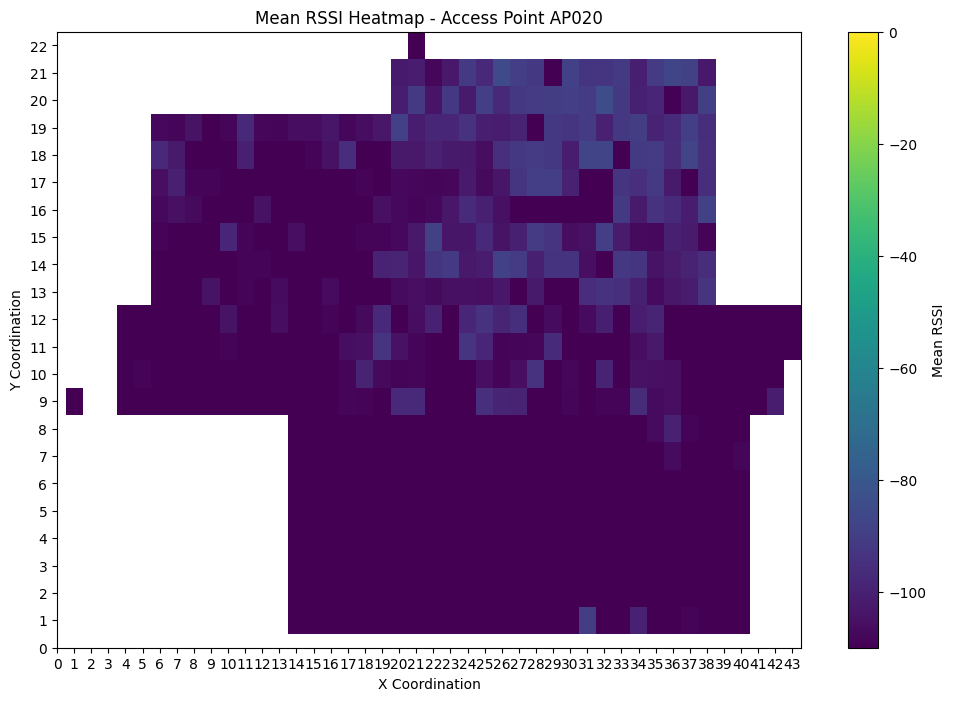

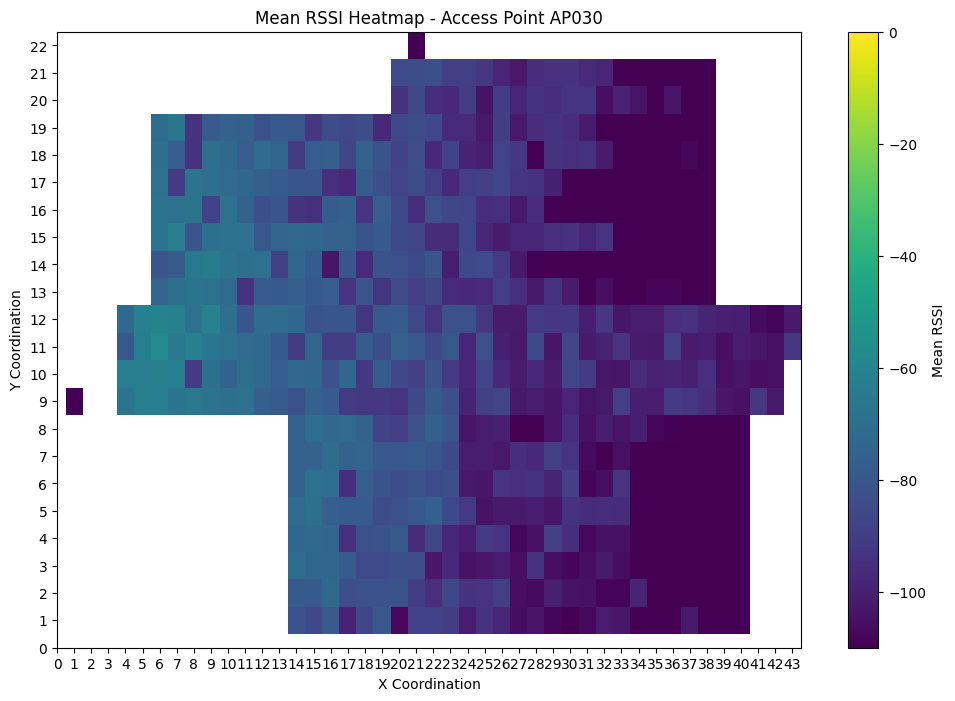

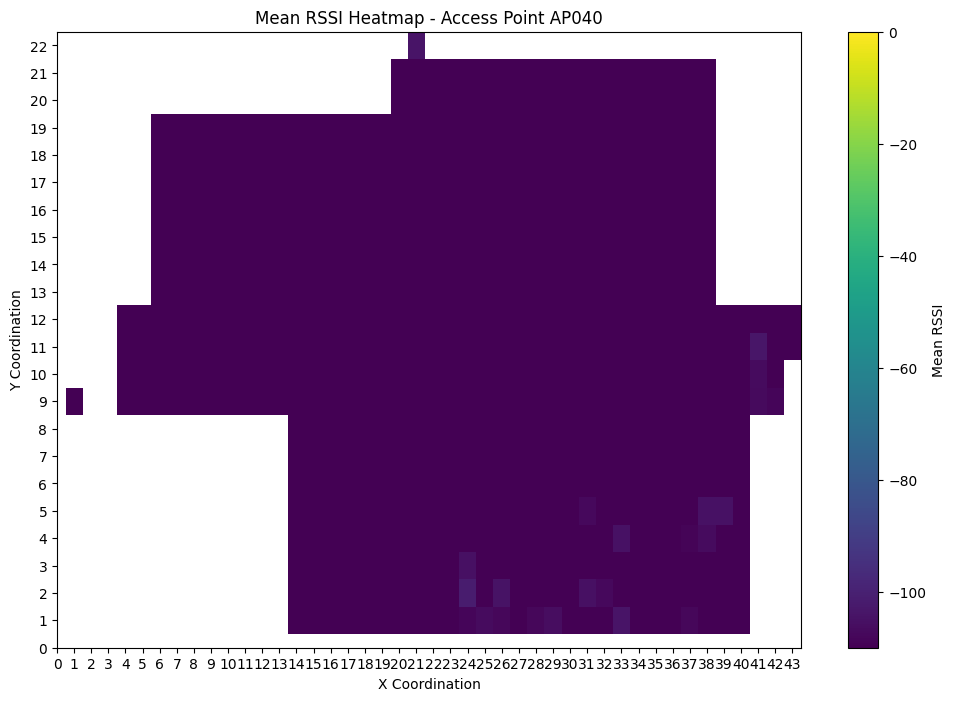

...

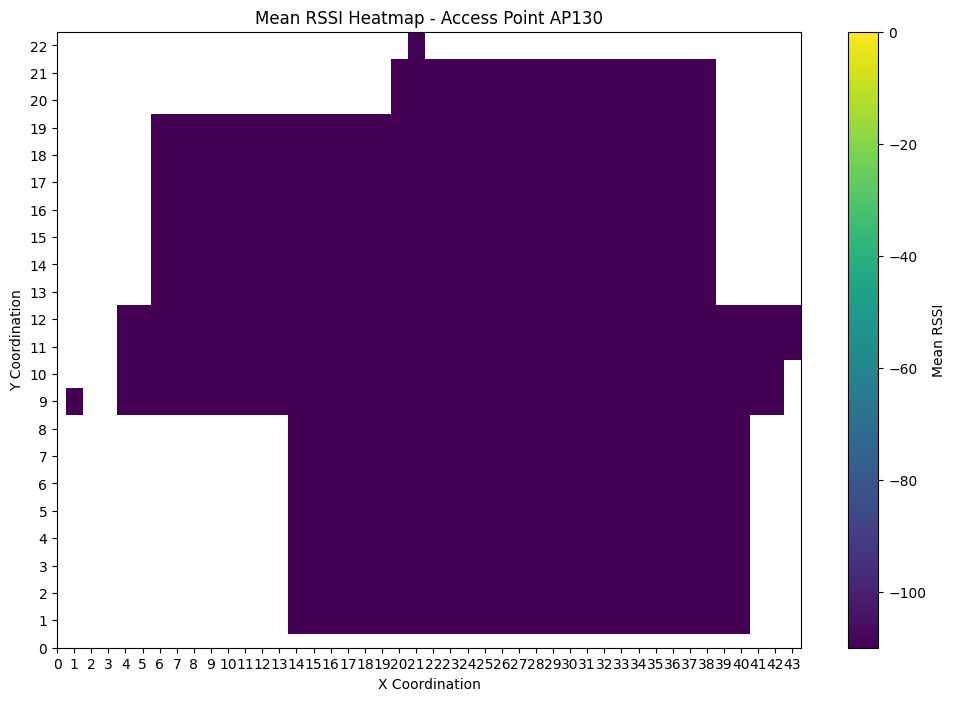

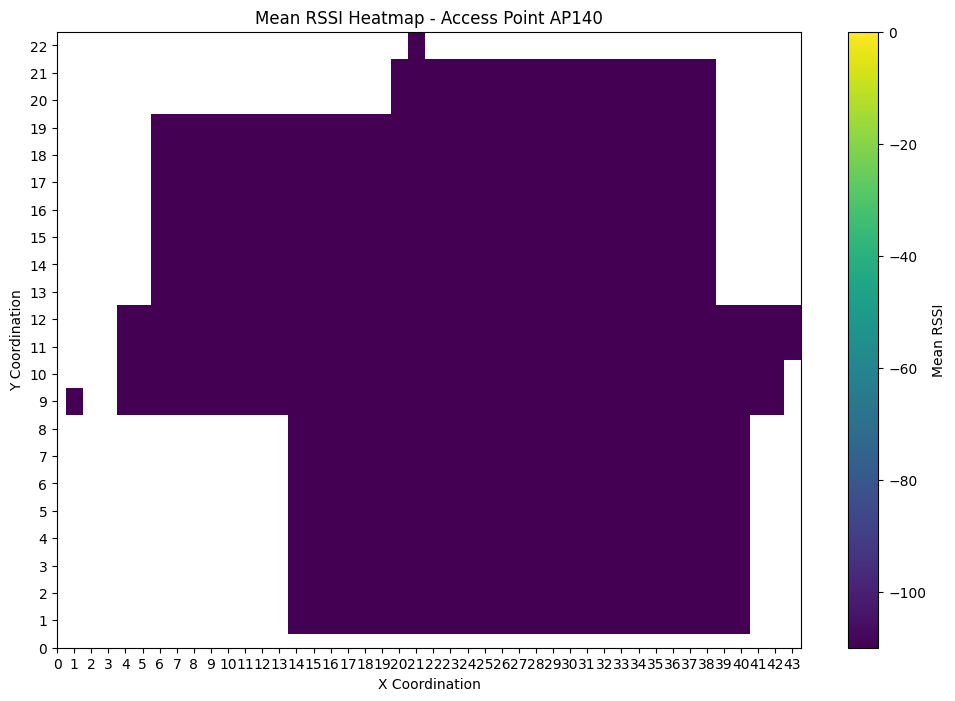

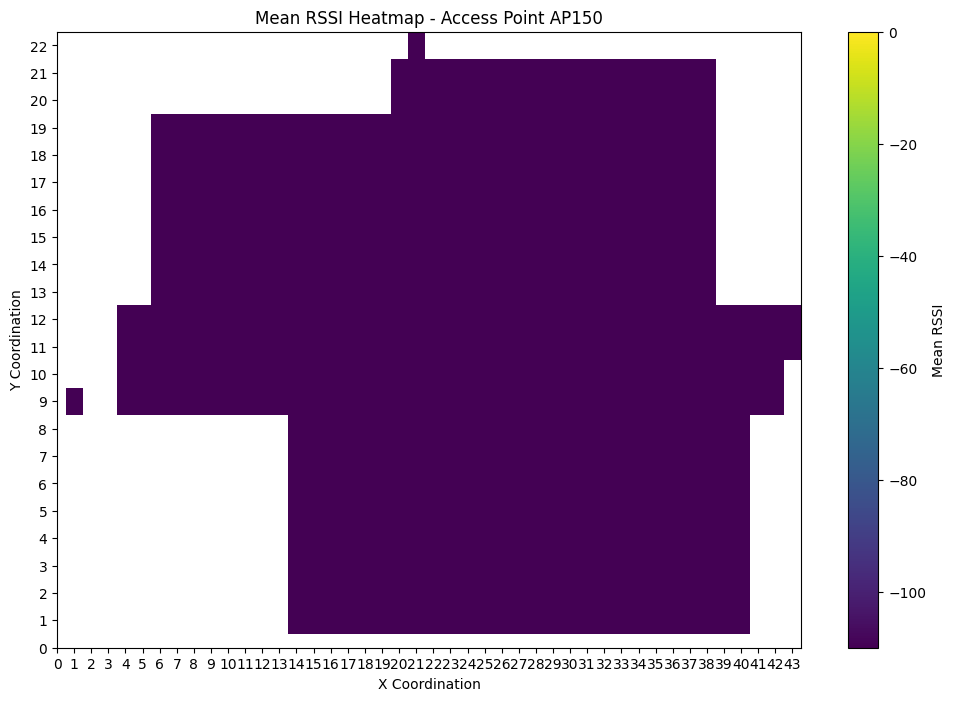

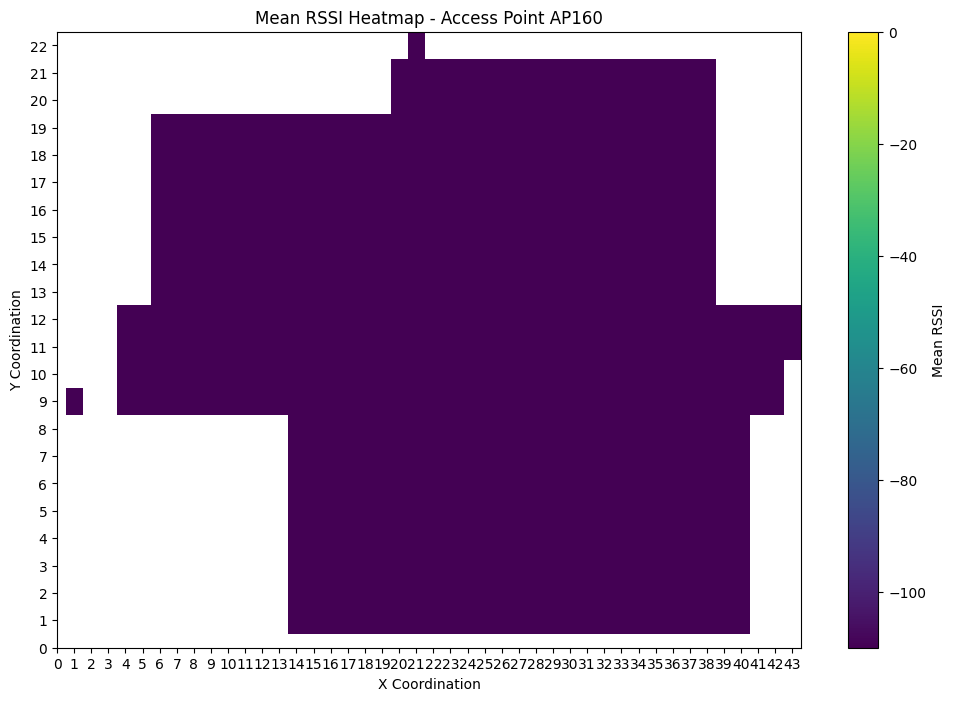

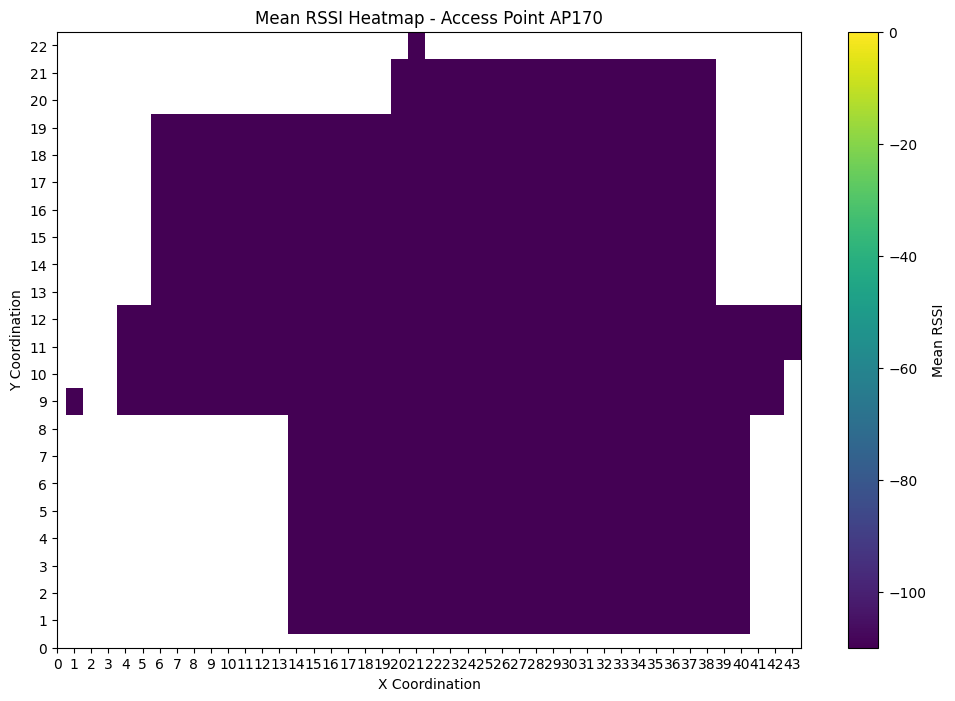

In [ ]:

# Assuming your dataset is in a DataFrame named 'df'
# Replace 'df' with the actual DataFrame name

# Create a new DataFrame with only the columns containing RSSI values
df_rssi = df.filter(regex=r'^AP\d+$')
b = 0

# Filter data for Level 4
df_level4 = df[df['Cid'].str.startswith('L4')]

# Plot a heatmap for each access point
for col in df_rssi.columns:
  b=b+1
  if (b%10==0 or b==3):
    # Extract X and Y information from the labels for Level 4
    df_location = pd.DataFrame()
    df_location[['Level', 'X', 'Y']] = df_level4['Cid'].str.extract(r'L(\d+)-(\d+)-(\d+)').astype(int)

    # Combine the location DataFrame with the RSSI values for the current access point
    df_location['RSSI'] = df_level4[col]

    # Create a 2D grid of X and Y coordinates
    xedges = np.arange(df_location['X'].min() - 0.5, df_location['X'].max() + 1.5, 1)
    yedges = np.arange(df_location['Y'].min() - 0.5, df_location['Y'].max() + 1.5, 1)

    # Initialize an array to store the average RSSI values for each bin
    avg_rssi = np.zeros((len(xedges) - 1, len(yedges) - 1))

    # Calculate the average RSSI for each bin
    for i in range(len(xedges) - 1):
        for j in range(len(yedges) - 1):
            x_bin_mask = (df_location['X'] >= xedges[i]) & (df_location['X'] < xedges[i + 1])
            y_bin_mask = (df_location['Y'] >= yedges[j]) & (df_location['Y'] < yedges[j + 1])

            bin_mask = x_bin_mask & y_bin_mask

            avg_rssi[i, j] = df_location.loc[bin_mask, 'RSSI'].mean()

    # Manually scale the colormap based on RSSI values
    norm = Normalize(vmin=-110, vmax=0)

    # Plot the heatmap with the scaled colormap
    plt.figure(figsize=(12, 8))
    plt.pcolormesh(xedges, yedges, avg_rssi.T, cmap='viridis', shading='auto', norm=norm)


    # # Display integer values in the middle of each block
    # for i in range(len(xedges) - 1):
    #     for j in range(len(yedges) - 1):
    #         value = int(heatmap[i, j])
    #         plt.text((xedges[i] + xedges[i + 1]) / 2, (yedges[j] + yedges[j + 1]) / 2, value,
    #                   ha='center', va='center', color='black', fontsize=8)

    # Add colorbar
    cbar = plt.colorbar()
    cbar.set_label('Mean RSSI')

    # Set axis labels and title
    plt.xlabel('X Coordination')
    plt.ylabel('Y Coordination')
    plt.title(f'Mean RSSI Heatmap - Access Point {col}')

    # Set integer ticks on both axes
    plt.xticks(np.arange(int(xedges.min()), int(xedges.max()) + 1, 1))
    plt.yticks(np.arange(int(yedges.min()), int(yedges.max()) + 1, 1))

    # Show the plot
    plt.show()


## PCA

In [8]:
selected_column = df.drop(columns='Cid')
selected_column = selected_column.drop(columns='Ts')
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(selected_column)


### n_component = 1

In [9]:
pca = PCA(n_components=1)
data_pca = pca.fit_transform(data_scaled)

In [10]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.475) total time= 1.3min
[CV] END ................................ score: (test=0.480) total time= 1.2min
[CV] END ................................ score: (test=0.470) total time= 1.2min
[CV] END ................................ score: (test=0.473) total time= 1.2min
[CV] END ................................ score: (test=0.476) total time= 1.2min
0.47468859229383487
Processing time: 379.60765171051025 seconds


### n_component = 2

In [26]:
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

In [28]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.715) total time= 1.7min
[CV] END ................................ score: (test=0.706) total time= 1.4min
[CV] END ................................ score: (test=0.706) total time= 1.4min
[CV] END ................................ score: (test=0.709) total time= 1.4min
[CV] END ................................ score: (test=0.711) total time= 1.4min
0.7096278793339639
Processing time: 450.8493297100067 seconds


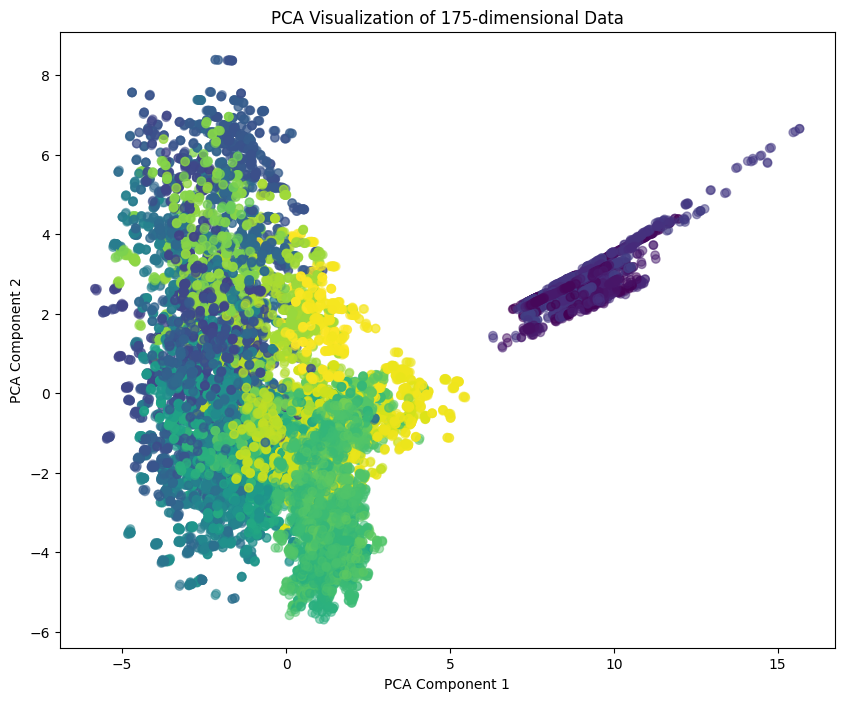

In [30]:
# Convert categorical 'y' values to numerical labels
label_encoder = LabelEncoder()
df['Cid_encoded'] = label_encoder.fit_transform(df['Cid'])

# Create a scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=df['Cid_encoded'], alpha=0.5)

# # Add colorbar
# plt.colorbar(scatter, ticks=range(len(label_encoder.classes_)), label='y-value')
# plt.xticks(range(len(label_encoder.classes_)), label_encoder.classes_)

plt.title('PCA Visualization of 175-dimensional Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

### n_component = 3

In [19]:
pca = PCA(n_components=3)
data_pca = pca.fit_transform(data_scaled)

In [20]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.901) total time= 1.3min
[CV] END ................................ score: (test=0.904) total time= 1.2min
[CV] END ................................ score: (test=0.892) total time= 1.3min
[CV] END ................................ score: (test=0.890) total time= 1.3min
[CV] END ................................ score: (test=0.895) total time= 1.3min
0.8963096597251112
Processing time: 391.7839710712433 seconds


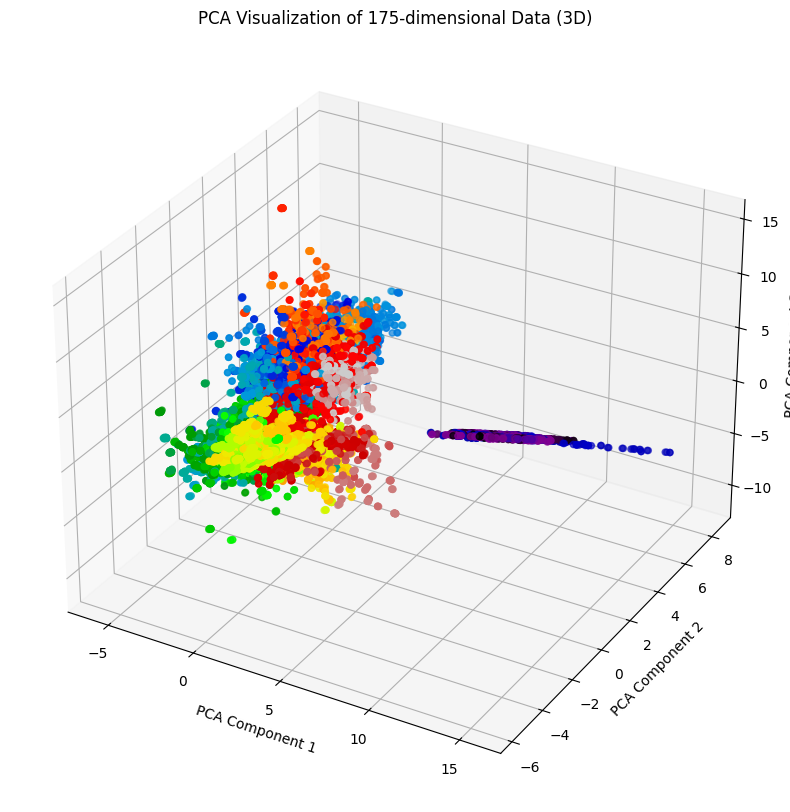

In [25]:
# Assuming 'data_tsne' has 3 components for t-SNE
data_pca_3d = data_pca  # Replace with your 3D t-SNE data

# Convert categorical 'y' values to numerical labels
label_encoder = LabelEncoder()
df['Cid_encoded'] = label_encoder.fit_transform(df['Cid'])

# Choose a high-contrast color palette (e.g., Set1 from seaborn)
color_palette = sns.color_palette("Set1", len(label_encoder.classes_))

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    data_pca_3d[:, 0],
    data_pca_3d[:, 1],
    data_pca_3d[:, 2],
    c=df['Cid_encoded'],
    cmap='nipy_spectral',  # Use seaborn color palette directly
)


ax.set_title('PCA Visualization of 175-dimensional Data (3D)')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')

plt.show()

### n_component = 5

In [11]:
pca = PCA(n_components=5)
data_pca = pca.fit_transform(data_scaled)

In [12]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.935) total time= 1.6min
[CV] END ................................ score: (test=0.931) total time= 1.7min
[CV] END ................................ score: (test=0.929) total time= 1.6min
[CV] END ................................ score: (test=0.924) total time= 1.6min
[CV] END ................................ score: (test=0.928) total time= 1.7min
0.929348631432194
Processing time: 492.1310324668884 seconds


### n_component = 10

In [ ]:
pca = PCA(n_components=10)
data_pca = pca.fit_transform(data_scaled)

In [ ]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.950) total time= 2.5min
[CV] END ................................ score: (test=0.947) total time= 2.6min
[CV] END ................................ score: (test=0.940) total time= 2.5min
[CV] END ................................ score: (test=0.939) total time= 2.6min
[CV] END ................................ score: (test=0.946) total time= 2.6min
0.9445277497433372
Processing time: 768.9435803890228 seconds


### n_component = 25

In [ ]:
pca = PCA(n_components=25)
data_pca = pca.fit_transform(data_scaled)

In [ ]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.959) total time= 4.5min
[CV] END ................................ score: (test=0.956) total time= 4.6min
[CV] END ................................ score: (test=0.950) total time= 4.6min
[CV] END ................................ score: (test=0.946) total time= 4.6min
[CV] END ................................ score: (test=0.952) total time= 4.5min
0.9525705535148971
Processing time: 1366.7227697372437 seconds


### n_component = 50

In [ ]:
pca = PCA(n_components=50)
data_pca = pca.fit_transform(data_scaled)

In [ ]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.961) total time= 6.7min
[CV] END ................................ score: (test=0.957) total time= 6.6min
[CV] END ................................ score: (test=0.950) total time= 6.7min
[CV] END ................................ score: (test=0.952) total time= 6.6min
[CV] END ................................ score: (test=0.955) total time= 6.6min
0.9548967021548483
Processing time: 1995.149543762207 seconds


### n_component = 100

In [ ]:
pca = PCA(n_components=100)
data_pca = pca.fit_transform(data_scaled)

In [ ]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_pca, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.961) total time=10.5min
[CV] END ................................ score: (test=0.960) total time=10.4min
[CV] END ................................ score: (test=0.950) total time=10.6min
[CV] END ................................ score: (test=0.952) total time=10.4min
[CV] END ................................ score: (test=0.956) total time=10.5min
0.9558429189355909
Processing time: 3145.246957063675 seconds


## t-SNE

In [10]:
selected_column = df.drop(columns='Cid')
selected_column = selected_column.drop(columns='Ts')
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(selected_column)

### n_component = 1

In [16]:
# Record the start time
start_time = time.time()


# Apply t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=1, random_state=42, n_jobs = -1)
data_tsne = tsne.fit_transform(data_scaled)

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")


C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


Processing time: 56.93338680267334 seconds


In [14]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_tsne, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.852) total time= 1.1min
[CV] END ................................ score: (test=0.850) total time= 1.1min
[CV] END ................................ score: (test=0.852) total time= 1.1min
[CV] END ................................ score: (test=0.840) total time= 1.0min
[CV] END ................................ score: (test=0.844) total time= 1.1min
0.8475791068693603
Processing time: 320.22983503341675 seconds


### n_component = 2

In [15]:
# Record the start time
start_time = time.time()


# Apply t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=3, random_state=42, n_jobs = -1)
data_tsne = tsne.fit_transform(data_scaled)

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")


Processing time: 251.00109195709229 seconds


In [33]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_tsne, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.958) total time= 1.4min
[CV] END ................................ score: (test=0.954) total time= 1.4min
[CV] END ................................ score: (test=0.949) total time= 1.4min
[CV] END ................................ score: (test=0.945) total time= 1.4min
[CV] END ................................ score: (test=0.950) total time= 1.6min
0.9510329007220137
Processing time: 442.2837312221527 seconds


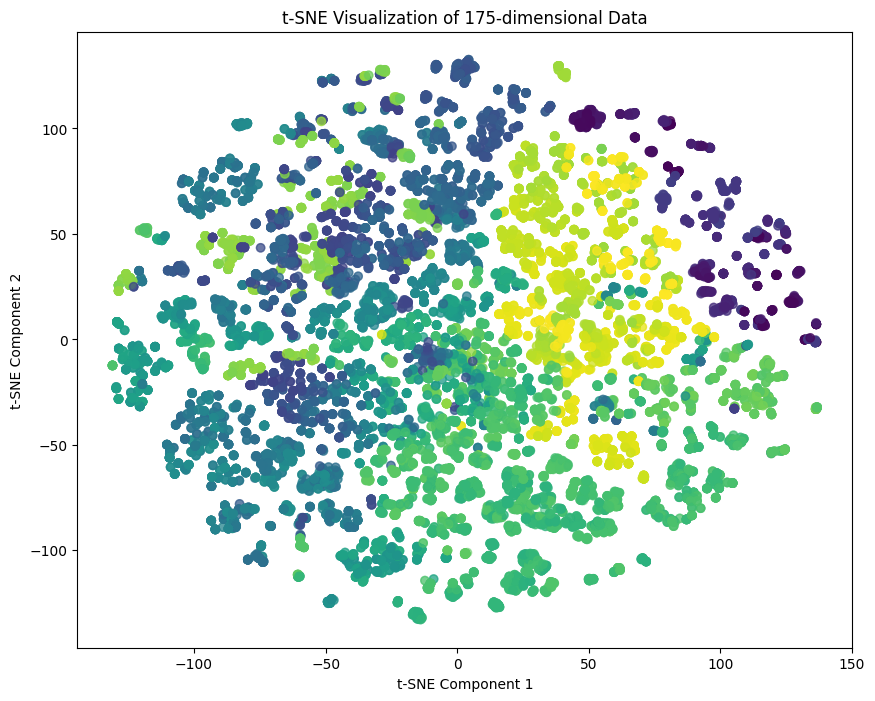

In [34]:
# Convert categorical 'y' values to numerical labels
label_encoder = LabelEncoder()
df['Cid_encoded'] = label_encoder.fit_transform(df['Cid'])



# Create a scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=df['Cid_encoded'], alpha=0.5)

# # Add colorbar
# plt.colorbar(scatter, ticks=range(len(label_encoder.classes_)), label='y-value')
# plt.xticks(range(len(label_encoder.classes_)), label_encoder.classes_)

plt.title('t-SNE Visualization of 175-dimensional Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

C:\Users\Hamid\AppData\Local\Temp\ipykernel_3372\2731895127.py:8: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


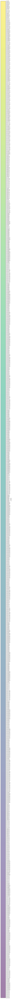

In [35]:
# Create a separate figure for the colorbar
fig_colorbar, ax_colorbar = plt.subplots(figsize=(1, 200))
cbar = plt.colorbar(scatter, ticks=range(len(label_encoder.classes_)), cax=ax_colorbar, label='y-value')
cbar.set_ticks(range(len(label_encoder.classes_)))
cbar.set_ticklabels(label_encoder.classes_)

# Adjust layout to prevent clipping of colorbar labels
plt.tight_layout()

### n_component = 3

In [8]:
# Record the start time
start_time = time.time()


# Apply t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=3, random_state=42, n_jobs = -1)
data_tsne = tsne.fit_transform(data_scaled)

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")


Processing time: 1000.0925753116608 seconds


In [9]:
# Train a Random Forest classifier

# Record the start time
start_time = time.time()

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(rf_classifier, data_tsne, df['Cid'], cv=cv, verbose = 3)

print(scores.mean())

# Record the end time
end_time = time.time()

# Calculate and print the processing time
processing_time = end_time - start_time
print(f"Processing time: {processing_time} seconds")

C:\Users\Hamid\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ................................ score: (test=0.961) total time= 1.3min
[CV] END ................................ score: (test=0.957) total time= 1.6min
[CV] END ................................ score: (test=0.951) total time= 1.1min
[CV] END ................................ score: (test=0.947) total time= 1.6min
[CV] END ................................ score: (test=0.952) total time= 1.8min
0.9535561791534448
Processing time: 453.2892231941223 seconds


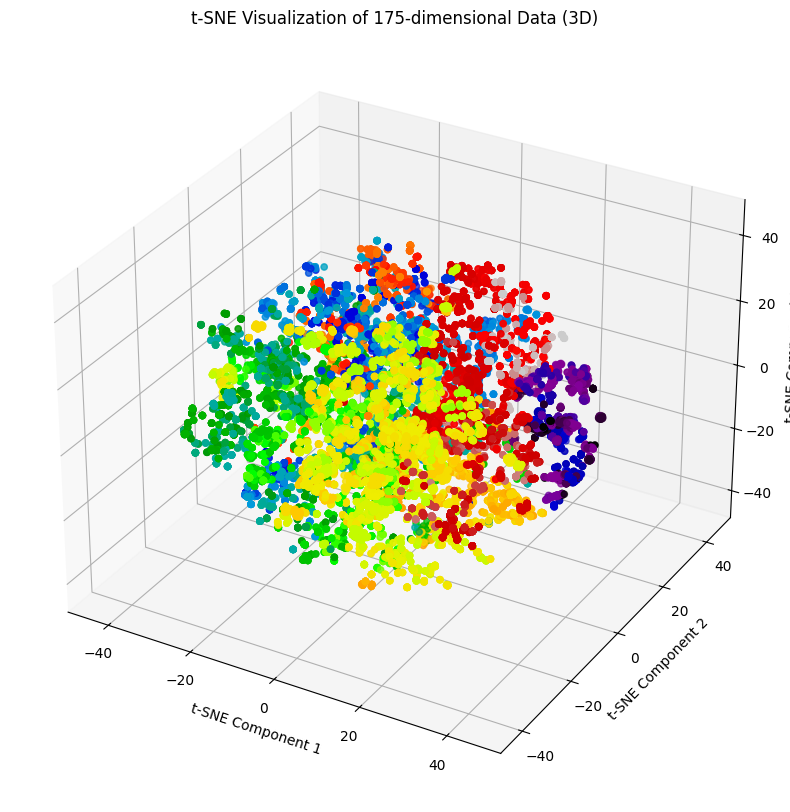

In [34]:
# Assuming 'data_tsne' has 3 components for t-SNE
data_tsne_3d = data_tsne  # Replace with your 3D t-SNE data

# Convert categorical 'y' values to numerical labels
label_encoder = LabelEncoder()

df_buf = pd.DataFrame()
df_buf = df

df_buf['Cid_encoded'] = label_encoder.fit_transform(df_buf['Cid'])

# Choose a high-contrast color palette (e.g., Set1 from seaborn)
color_palette = sns.color_palette("Set1", len(label_encoder.classes_))

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    data_tsne_3d[:, 0],
    data_tsne_3d[:, 1],
    data_tsne_3d[:, 2],
    c=df_buf['Cid_encoded'],
    cmap='nipy_spectral',  # Use seaborn color palette directly
)


ax.set_title('t-SNE Visualization of 175-dimensional Data (3D)')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')

plt.show()

C:\Users\Hamid\AppData\Local\Temp\ipykernel_10272\2731895127.py:8: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


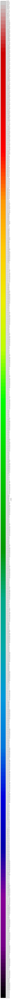

In [14]:
# Create a separate figure for the colorbar
fig_colorbar, ax_colorbar = plt.subplots(figsize=(1, 200))
cbar = plt.colorbar(scatter, ticks=range(len(label_encoder.classes_)), cax=ax_colorbar, label='y-value')
cbar.set_ticks(range(len(label_encoder.classes_)))
cbar.set_ticklabels(label_encoder.classes_)

# Adjust layout to prevent clipping of colorbar labels
plt.tight_layout()

In [24]:
import plotly.express as px


# Choose a high-contrast color palette (e.g., Set1 from seaborn)
color_palette = sns.color_palette("Set1", len(label_encoder.classes_))

# Create a 3D scatter plot with Plotly
fig = px.scatter_3d(
    df_buf,
    x=data_tsne_3d[:, 0],
    y=data_tsne_3d[:, 1],
    z=data_tsne_3d[:, 2],
    color='Cid_encoded',
    color_discrete_sequence=color_palette,
    title='t-SNE Visualization of 175-dimensional Data (3D)',
    labels={'Cid_encoded': 'Cid'},
    template='plotly',
    size_max=10,
    size='Cid_encoded'
)

# Save the plot as an HTML file
fig.write_html('3d_plot.html')

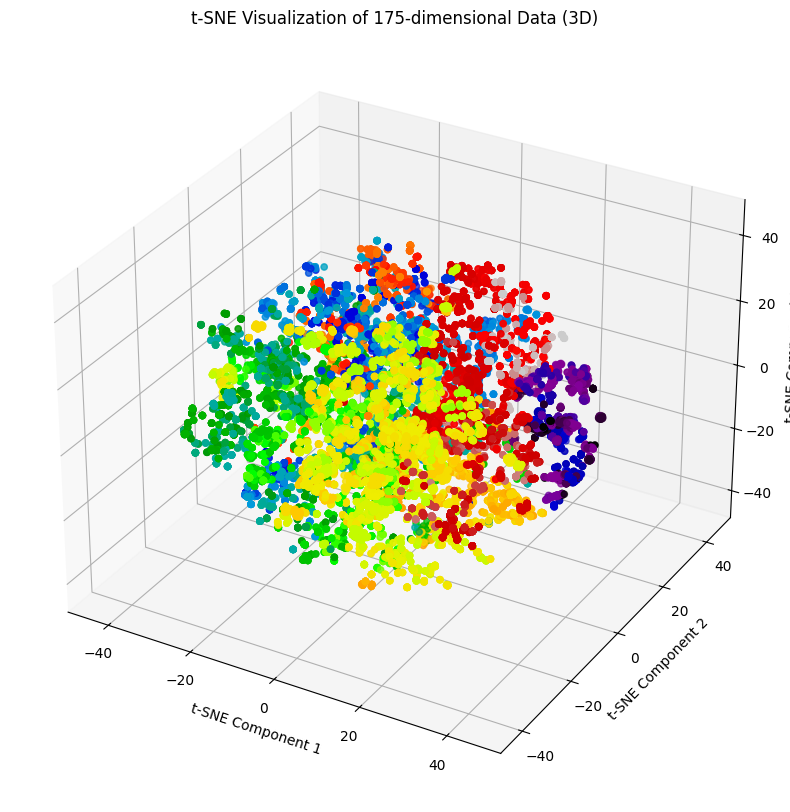

In [54]:
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

# Choose a high-contrast color palette (e.g., Set1 from seaborn)
color_palette = sns.color_palette("Set1", len(label_encoder.classes_))

# Convert categorical 'y' values to numerical labels
df_buf['Cid_encoded'] = label_encoder.fit_transform(df_buf['Cid'])

# Create a 3D scatter plot with Matplotlib
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    data_tsne_3d[:, 0],
    data_tsne_3d[:, 1],
    data_tsne_3d[:, 2],
    c=df_buf['Cid_encoded'],
    cmap='nipy_spectral',  # Use seaborn color palette directly
)

ax.set_title('t-SNE Visualization of 175-dimensional Data (3D)')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')

# Convert Matplotlib figure to Plotly figure
plotly_fig = go.Figure(data=go.Scatter3d(x=[], y=[], z=[], mode='markers'))

# Extract data from Matplotlib scatter plot
scatter_data = data_tsne_3d
colors = scatter.get_array()

# Add data to Plotly figure
plotly_fig.add_trace(go.Scatter3d(
    x=scatter_data[:, 0],
    y=scatter_data[:, 1],
    z=scatter_data[:, 2],
    mode='markers',
    marker=dict(
        color=colors,
        size=5,  # Adjust marker size as needed
        colorbar=dict(
            title='CID',  # Add color bar title
            tickvals=df_buf['Cid_encoded'].unique(),  # Use unique values as tick positions
            ticktext=label_encoder.inverse_transform(df_buf['Cid_encoded'].unique())  # Use labels for tick text
        ),
    ),
))

# Update layout
plotly_fig.update_layout(
    scene=dict(
        xaxis_title='t-SNE Component 1',
        yaxis_title='t-SNE Component 2',
        zaxis_title='t-SNE Component 3',
    ),
    title='t-SNE Visualization of 175-dimensional Data (3D)',
    # showlegend=True,
)

# Save Plotly figure as HTML
plotly_fig.write_html('3d_scatter_plot.html')


## Compare

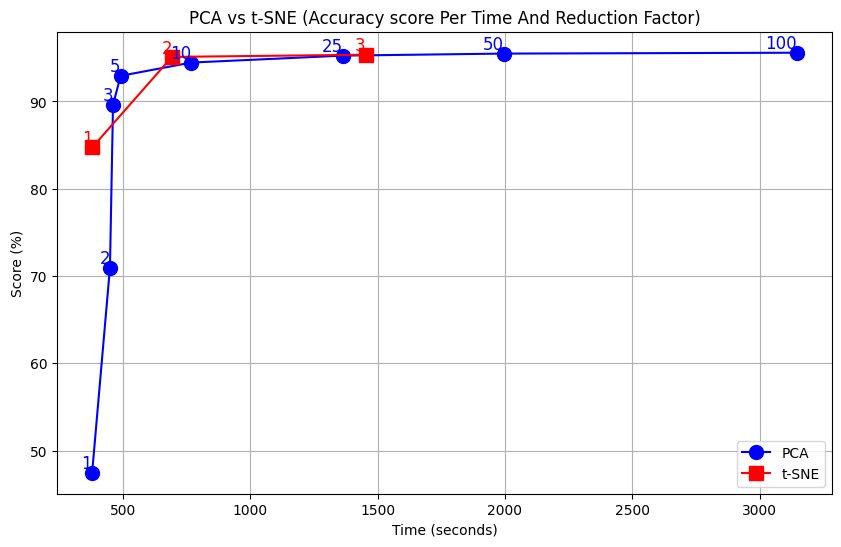

In [11]:
import matplotlib.pyplot as plt

# Data for PCA and t-SNE
pca = [(380, 47.46, 1), (450, 70.96, 2), (462, 89.63, 3), (492, 92.93, 5),
       (768, 94.45, 10), (1366, 95.25, 25), (1995, 95.48, 50), (3145, 95.58, 100)]

tsne = [(381, 84.75, 1), (693, 95.10, 2), (1453, 95.35, 3)]

# Unpack data for plotting
pca_x, pca_y, pca_label = zip(*pca)
tsne_x, tsne_y, tsne_label = zip(*tsne)

# Plotting
plt.figure(figsize=(10, 6))

# Plot PCA points and connect with lines
plt.plot(pca_x, pca_y, marker='o', markersize=10, linestyle='-', color='blue', label='PCA')
for x, y, label in zip(pca_x, pca_y, pca_label):
    plt.text(x, y, str(label), fontsize=12, color='blue', ha='right', va='bottom')

# Plot t-SNE points and connect with lines
plt.plot(tsne_x, tsne_y, marker='s', markersize=10, linestyle='-', color='red', label='t-SNE')
for x, y, label in zip(tsne_x, tsne_y, tsne_label):
    plt.text(x, y, str(label), fontsize=12, color='red', ha='right', va='bottom')

# Set labels and title
plt.xlabel('Time (seconds)')
plt.ylabel('Score (%)')
plt.title('PCA vs t-SNE (Accuracy score Per Time And Reduction Factor)')

# Add legend in the right-bottom corner
plt.legend(loc='lower right')

# Show the plot
plt.grid(True)
plt.show()